In [1]:
import numpy as np
import matplotlib.pyplot as plt
from joblib import Parallel, delayed

from scipy.stats import linregress
from scipy.special import erf

from randomnwn import *
from monitor import *

%load_ext line_profiler

units = get_units()

Creation: 0.017147278878837824


/tmp/ipykernel_1739076/3333941857.py:10: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  plot_NWN(NWN, scaled=True)


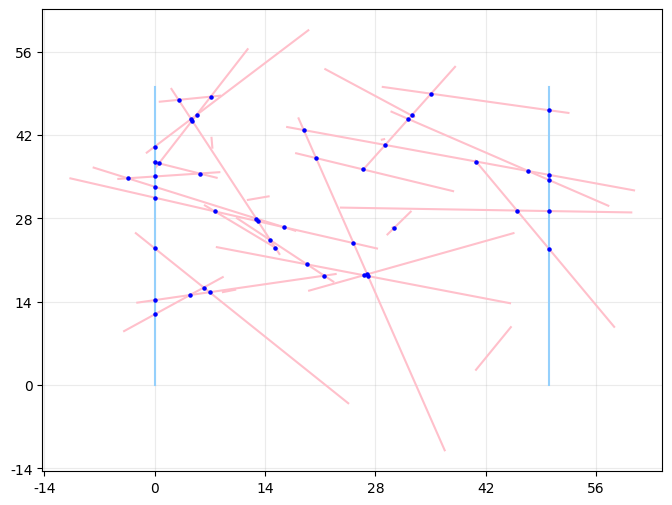

/home/parry/Documents/GitHub/Random-NWNs/randomnwn/plotting.py:179: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  "pos": {(i,): np.array(NWN.graph["lines"][i].centroid)


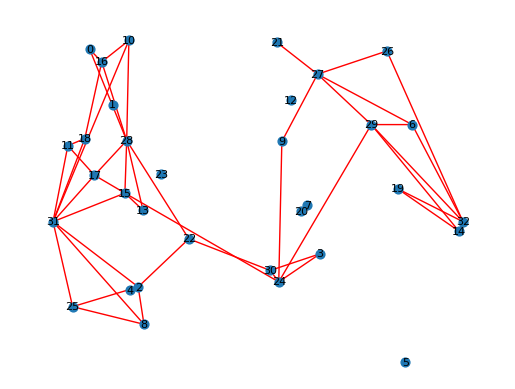

Plotting: 0.22874746192246675


In [2]:
length = 50.0 / units["l0"]
width = 50.0 / units["l0"]

with Runtime("Creation"):
    NWN = create_NWN(size=(length, width), density=0.3*2, wire_length_mean=1, wire_length_sd=4)
    left, right = add_electrodes(NWN, "left", "right")
    create_line_sections(NWN)

with Runtime("Plotting"):
    plot_NWN(NWN, scaled=True)
    draw_NWN(NWN)

In [3]:
NWN.graph["wire_num"]

33

<class 'networkx.utils.decorators.argmap'> compilation 4:4: FutureWarning: laplacian_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
/tmp/ipykernel_1739076/1467470447.py:9: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  plot_NWN_sections(NWN, section_current=get_section_current(NWN, voltages))


Input: 0.0 0.0 i0
Time elapsed: 0.10909849684685469
Input: 0.01 0.01 i0
Time elapsed: 0.034239979926496744
Input: 0.02 0.02 i0
Time elapsed: 0.03432209603488445
Input: 0.03 0.03 i0
Time elapsed: 0.03575039398856461
Input: 0.04 0.04 i0
Time elapsed: 0.03770945407450199
Input: 0.05 0.05 i0
Time elapsed: 0.03558976319618523
Input: 0.06 0.06 i0
Time elapsed: 0.03412539418786764
Input: 0.07 0.07 i0
Time elapsed: 0.033779395977035165
Input: 0.08 0.08 i0
Time elapsed: 0.033526916056871414
Input: 0.09 0.09 i0
Time elapsed: 0.033416891004890203
Input: 0.1 0.1 i0
Time elapsed: 0.033987491857260466
Input: 0.11 0.11 i0
Time elapsed: 0.08817820600233972
Input: 0.12 0.12 i0
Time elapsed: 0.03389628394506872
Input: 0.13 0.13 i0
Time elapsed: 0.03342252806760371
Input: 0.14 0.14 i0
Time elapsed: 0.032963273115456104
Input: 0.15 0.15 i0
Time elapsed: 0.0341120520606637
Input: 0.16 0.16 i0
Time elapsed: 0.04415910504758358
Input: 0.17 0.17 i0
Time elapsed: 0.03482551104389131
Input: 0.18 0.18 i0
Time el

/home/parry/Documents/GitHub/Random-NWNs/randomnwn/plotting.py:244: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(8, 6))


Time elapsed: 0.09185676416382194
Input: 0.22 0.22 i0
Time elapsed: 0.04417075589299202
Input: 0.23 0.23 i0
Time elapsed: 0.04765654099173844
Input: 0.24 0.24 i0
Time elapsed: 0.05190614494495094
Input: 0.25 0.25 i0
Time elapsed: 0.03387228911742568
Input: 0.26 0.26 i0
Time elapsed: 0.03501080209389329
Input: 0.27 0.27 i0
Time elapsed: 0.050462640123441815
Input: 0.28 0.28 i0
Time elapsed: 0.04281687084585428
Input: 0.29 0.29 i0
Time elapsed: 0.035799948032945395
Input: 0.3 0.3 i0
Time elapsed: 0.04849581094458699
Input: 0.31 0.31 i0
Time elapsed: 0.05310233007185161
Input: 0.32 0.32 i0
Time elapsed: 0.04547827108763158
Input: 0.33 0.33 i0
Time elapsed: 0.2135131771210581
Input: 0.34 0.34 i0
Time elapsed: 0.05812168400734663
Input: 0.35000000000000003 0.35000000000000003 i0
Time elapsed: 0.05631745303981006
Input: 0.36 0.36 i0
Time elapsed: 0.050423688953742385
Input: 0.37 0.37 i0
Time elapsed: 0.05499401199631393
Input: 0.38 0.38 i0
Time elapsed: 0.05603374098427594
Input: 0.39 0.39 i

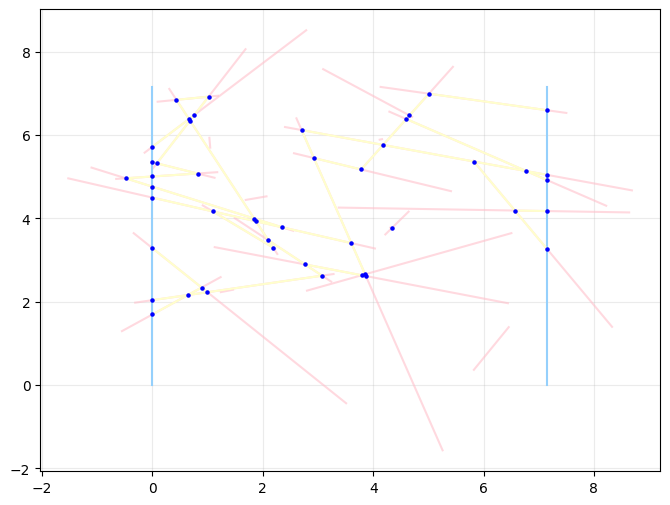

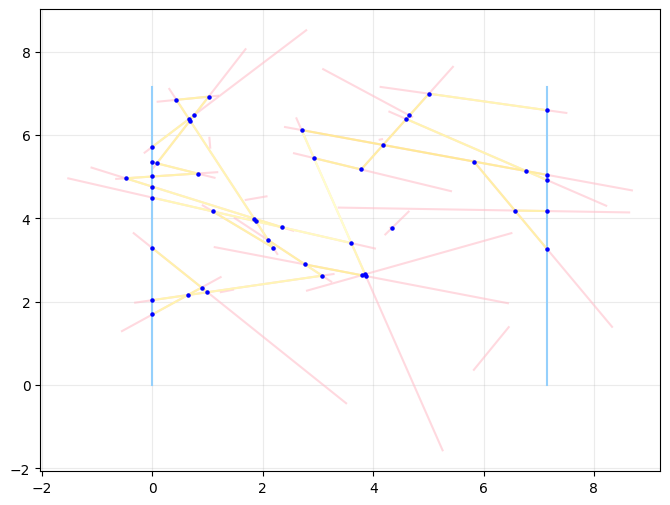

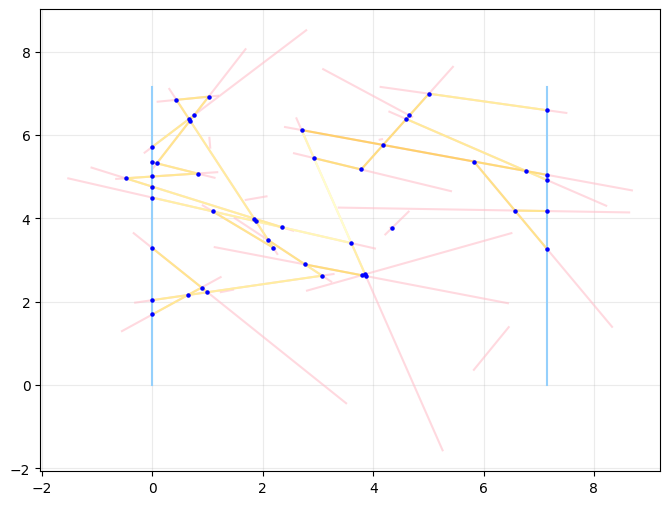

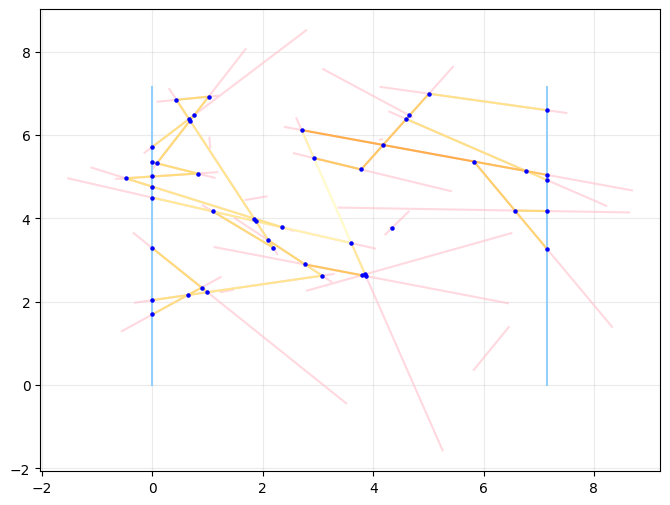

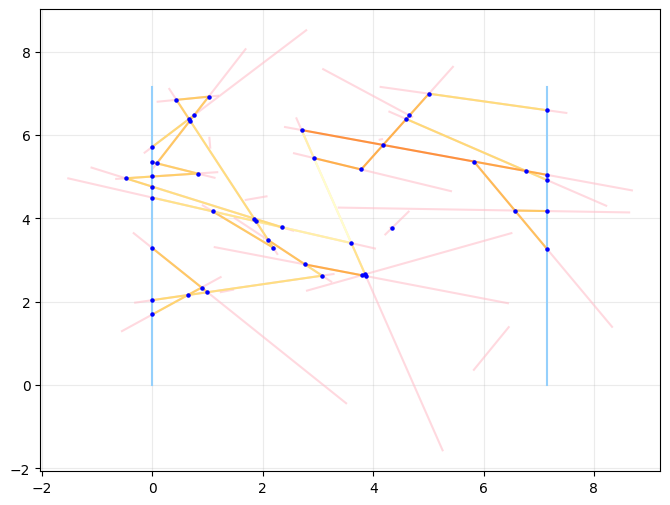

...

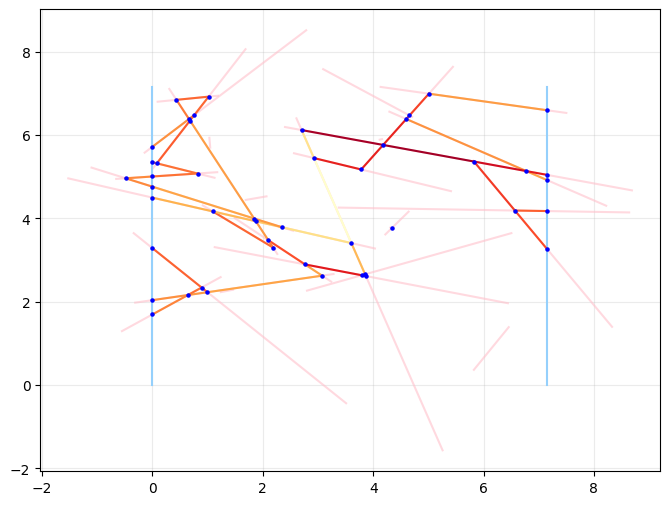

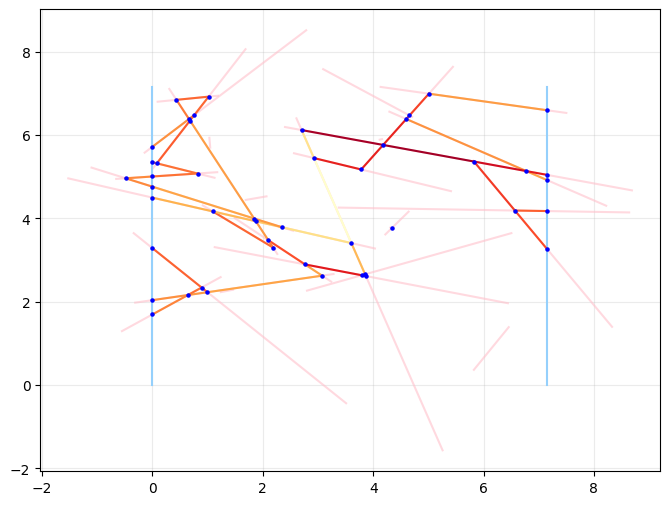

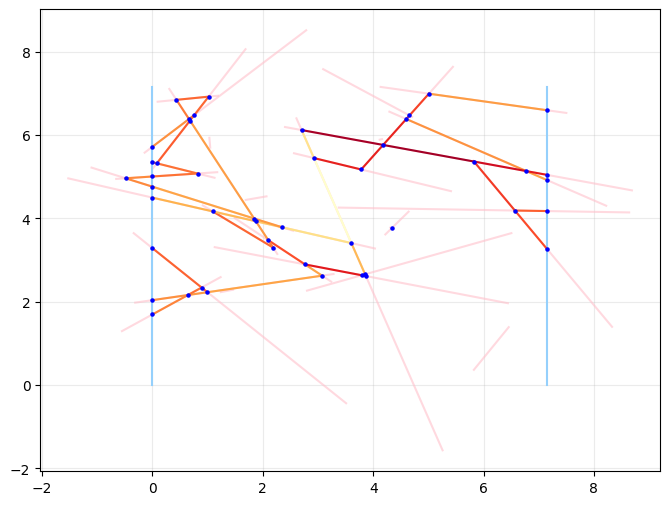

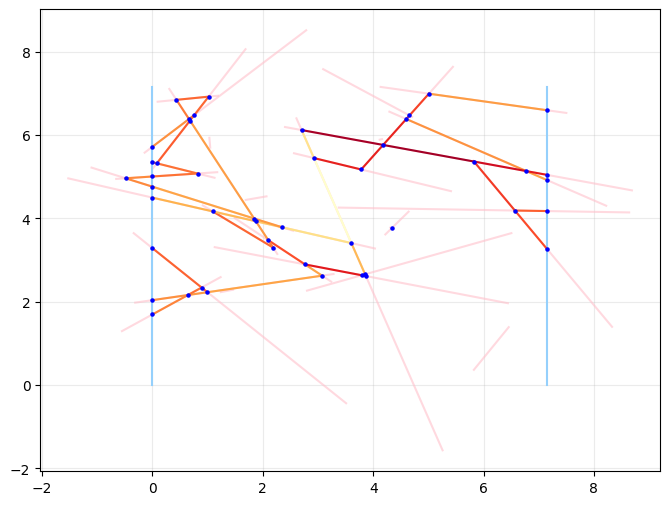

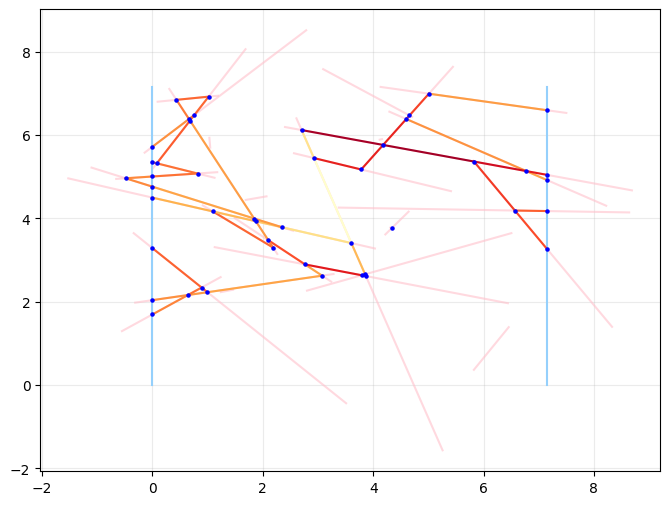

In [4]:
for i in np.arange(0, 1, 0.01):
    with Runtime():
        solve_type = 'current'
        voltages = solve_network(NWN, left, right, i, type=solve_type)
        current = voltages[-1] if solve_type == 'voltage' else i
        voltages = voltages[:-1] if solve_type == 'voltage' else voltages
        print(f'Input: {i}', current, "i0")
        # plot_NWN(NWN, scaled=True, color=voltages)
        plot_NWN_sections(NWN, section_current=get_section_current(NWN, voltages))
        

In [ ]:
for combination, point in NWN.graph["loc"].items():
    l1, l2 = combination
    dV = voltages[l2] - voltages[l1]

In [ ]:
print(NWN.graph)

In [ ]:
o1, o2 = NWN.graph['lines'][0].coords
print(o1, o2)

In [ ]:
p = list(NWN.graph['loc'].values())[0]

In [ ]:
p.coords[0]